In [1]:
import numpy as np
import matplotlib.pyplot as plt
import symnum
import symnum.numpy as snp
import numpy as np
import jax.numpy as jnp
from jax import jit, vmap, value_and_grad
from jax.example_libraries.optimizers import adam
import matplotlib.pyplot as plt
# from jax.config import config
# config.update('jax_enable_x64', True)
# config.update('jax_platform_name', 'cpu')
import density_ips_underdamped_LD

In [2]:
import jax
import jax.numpy as jnp

# Define the interaction term
def interaction_term(v_i, v_j):
    """Compute the interaction term between two particles."""
    return v_j - v_i

# Function to run a single simulation using JAX and scan
def run_simulation(seed, num_particles, num_steps, dt, model_parameters, discard_steps=0):
    # Set the random seed for reproducibility
    key = jax.random.PRNGKey(seed)

    λ = model_parameters['lambda']
    γ = model_parameters['gamma']
    σ = model_parameters['sigma']
    κ = model_parameters['kappa']

    # Initialize variables
    p = jnp.zeros(num_particles)  # Voltage-like variable
    q = jnp.zeros(num_particles)  # Recovery-like variable

    # Define the step function for scan
    def step(carry, _):
        p, q, key = carry

        # Compute interaction terms using jax.vmap
        def compute_interaction(v_all):
            return jax.vmap(lambda v_i: jnp.sum(jax.vmap(lambda v_j: interaction_term(v_i, v_j))(v_all)))(v_all)

        interaction = compute_interaction(q)

        # Generate random noise
        key, subkey = jax.random.split(key)
        noise = jax.random.normal(subkey, shape=(num_particles,))

        # Update underdamped langevin equations with interaction and noise
        grad_potential = λ * 4 * (q**2  - 0.5 ) * q 
        dp = (- grad_potential + κ * interaction/num_particles - γ * p) * dt + σ * jnp.sqrt(dt) * noise
        dq = p*dt
        
        p += dp
        q += dq

        return (p, q, key), (p, q)

    # Run the simulation using scan
    (p_final, q_final, _), (p_history, q_history) = jax.lax.scan(step, (p, q, key), jnp.arange(num_steps))

    # Combine v and w into pairs for each particle at each time step
    pq_pairs = jnp.stack((p_history, q_history), axis=-1)  # Shape: (num_steps, num_particles, 2)
    return pq_pairs[discard_steps:, :, :]

In [3]:
# Plot the results

def showplots(x_seq_sim, x_seq_obs, t_seq_sim, t_seq_obs):
    """Plot the voltage-like and recovery-like variables."""
    plt.figure(figsize=(12, 6))
    plt.plot(t_seq_sim, x_seq_sim[:, :, 0], '.', alpha=0.5, markersize=0.5)
    plt.plot(t_seq_obs, x_seq_obs[:, :, 0], '.', alpha=0.5, markersize=0.5)
    plt.title('Voltage-like Variable (v) Over Time')
    plt.xlabel('Time')
    plt.ylabel('v')
    plt.grid()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(t_seq_sim, x_seq_sim[:, :, 1], '.', alpha=0.5, markersize=0.5)
    plt.plot(t_seq_obs, x_seq_obs[:, :, 1], '.', alpha=0.5, markersize=0.5)
    plt.title('Recovery-like Variable (w) Over Time')
    plt.xlabel('Time')
    plt.ylabel('w')
    plt.grid()
    plt.show()


In [4]:
def drift_func_rough(x, θ, empirical_mean):
    λ, γ, σ, κ = θ
    grad_potential = λ * 4 * (x[1]**2  - 0.5 ) * x[1] 

    return snp.array([- grad_potential - γ * x[0] + κ * (empirical_mean - x[1])]) 
    
def drift_func_smooth(x, θ):
    return snp.array([x[0]])

def diff_coeff_rough(x, θ):
    *_, σ, κ = θ
    return snp.array([[σ]]) 
    
def diff_coeff(x, θ):
    *_, σ, κ = θ
    return snp.array([[σ], [0]]) 


In [5]:
dim_x = 2
dim_θ = 4

symolic_log_transition_density_generators = {
    'local_gaussian': density_ips_underdamped_LD.local_gaussian_log_transition_density,
    'euler_maruyama': density_ips_underdamped_LD.euler_maruyama_log_transition_density_rough,
}

jax_log_transition_densities = {
    key: symnum.numpify(dim_x, dim_x, dim_θ, None, None,numpy_module=jnp)(
        symbolic_transition_density_generator(
            drift_func_rough, drift_func_smooth, diff_coeff_rough
        )
    )
    for key, symbolic_transition_density_generator in 
    symolic_log_transition_density_generators.items()
}


In [6]:
def get_log_likelihood_functions(log_transition_density):
    @jit
    # Function to compute the log-likelihood of θ given fixed indices, say for 'i'-th particle. Single particle over the time interval.

    def log_likelihood_θ_fixed_index(θ, x_seq, t_seq, empirical_mean_seq):
        log_transition_density_terms = vmap(log_transition_density, (0, 0, None, 0, 0))(
            x_seq[1:], x_seq[:-1], θ, t_seq[1:] - t_seq[:-1], empirical_mean_seq[:-1]
        )
        return log_transition_density_terms.sum()
    
    @jit
    # Full likelihood, which sums over all particles.
    def log_likelihood_θ(θ, x_seq_particles, t_seq, empirical_mean_seq):
        # Vectorized computation of log likelihood for all particles
        log_likelihood_terms = jnp.sum(
            vmap(log_likelihood_θ_fixed_index, (None, 1, None, None))(
                θ, x_seq_particles, t_seq, empirical_mean_seq
            )
        )
        return log_likelihood_terms
            
    return {'θ': log_likelihood_θ}
 

In [7]:
def compute_complete_maximum_likelihood_estimates(
    log_likelihood, t_seq, x_seq_particles, empirical_mean_seq, θ_0, optimizer=adam, n_steps=5000, step_size= 0.005
):
    optimizer_init, optimizer_update, optimizer_get_params = optimizer(step_size)
    
    @jit 
    def optimizer_step(step_index, state, x_seq_particles, t_seq, empirical_mean_seq):
        value, grad = value_and_grad(log_likelihood["θ"])(
            optimizer_get_params(state), x_seq_particles, t_seq, empirical_mean_seq
        )
        state = optimizer_update(step_index, -grad, state)
        return value, state

    state = optimizer_init(θ_0)

    for s in range(n_steps):
        _, state = optimizer_step(s, state, x_seq_particles, t_seq, empirical_mean_seq)
        # print(optimizer_get_params(state))
        
    return optimizer_get_params(state)


Iteration 1
Compute the sample paths


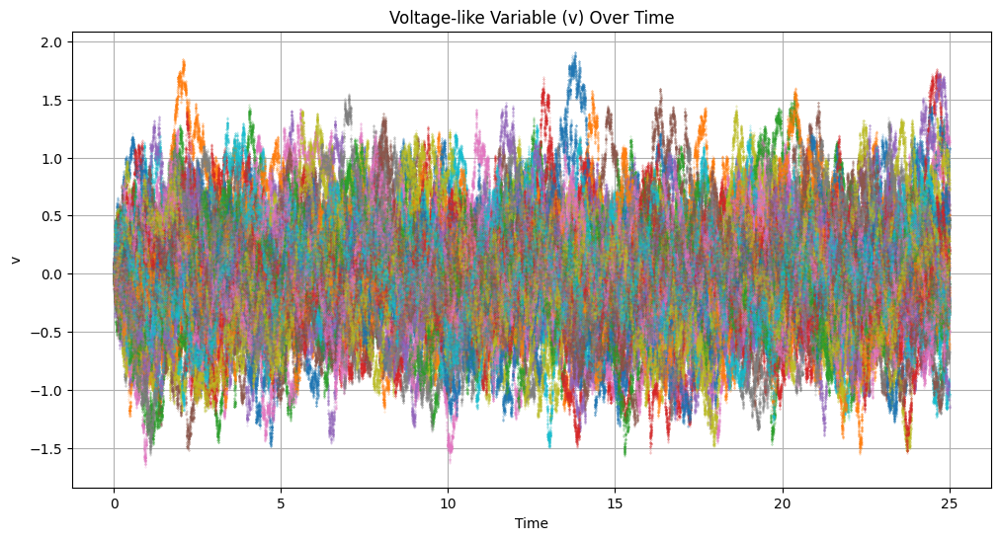

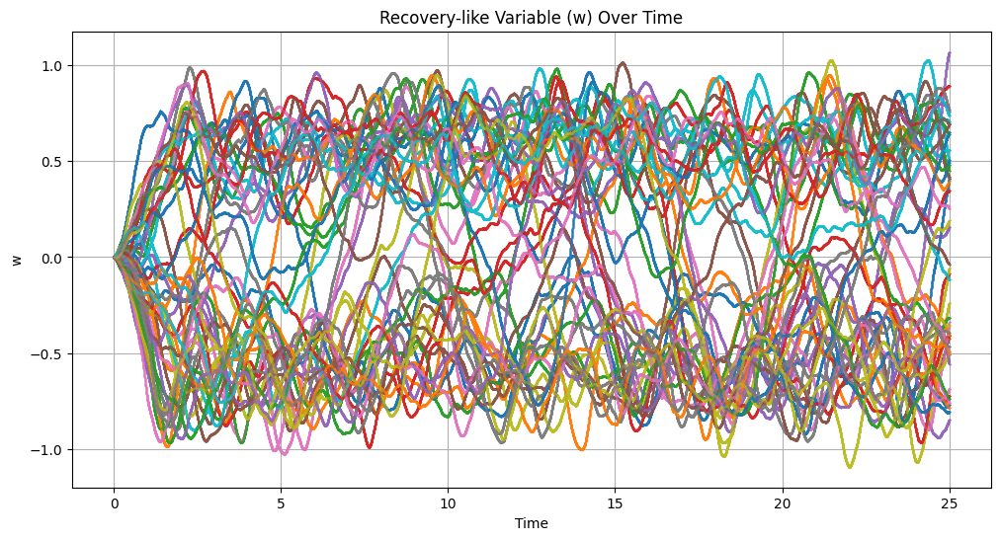

Optimising EM-based contrast estimator starts.
[1.9999522  1.49758935 0.79412961 1.0004648 ]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[1.99994886 1.49758923 0.79768282 1.0004642 ]
Optimising LG-based contrast estimator ends.
Iteration 2
Compute the sample paths


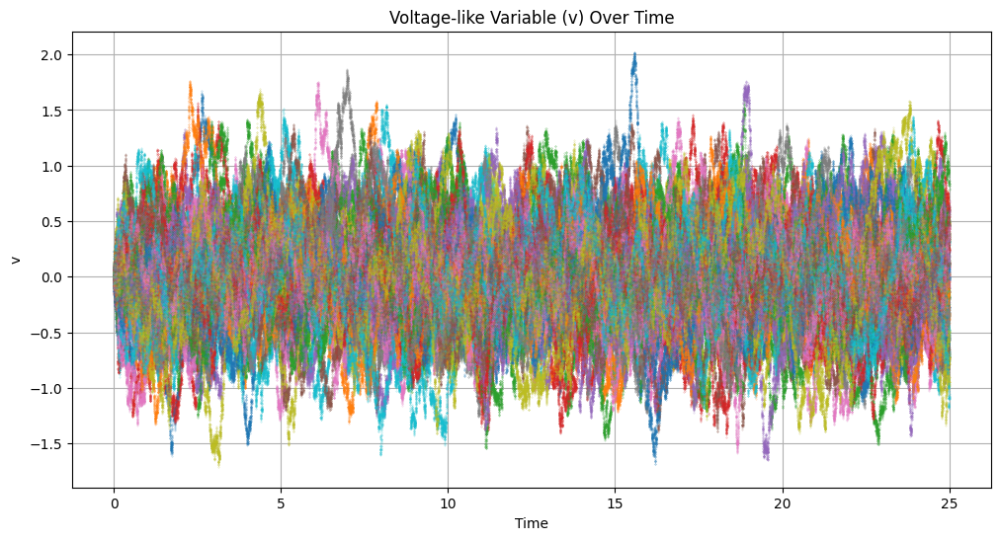

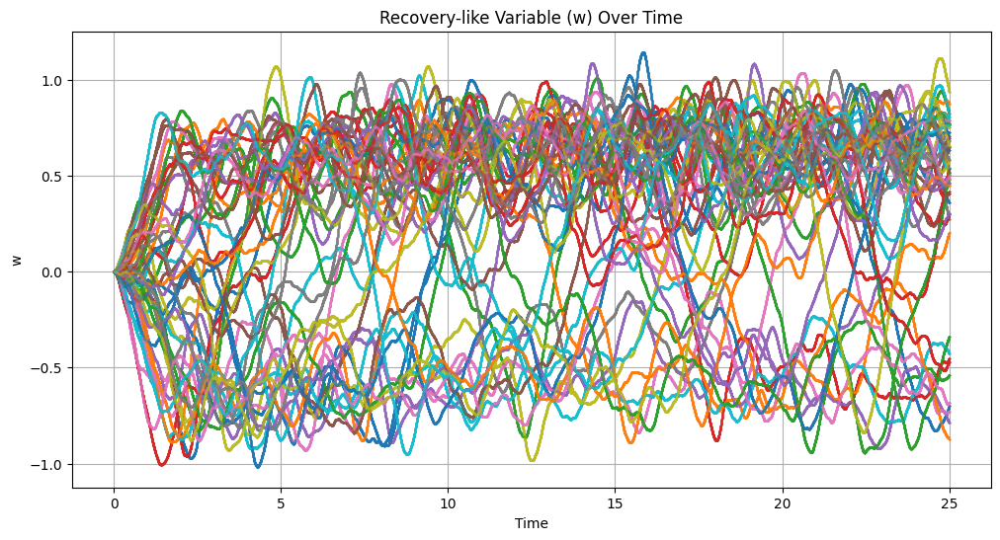

Optimising EM-based contrast estimator starts.
[1.97671235 1.5507555  0.79320014 0.96516091]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[1.97670805 1.55075538 0.79768503 0.96516049]
Optimising LG-based contrast estimator ends.
Iteration 3
Compute the sample paths


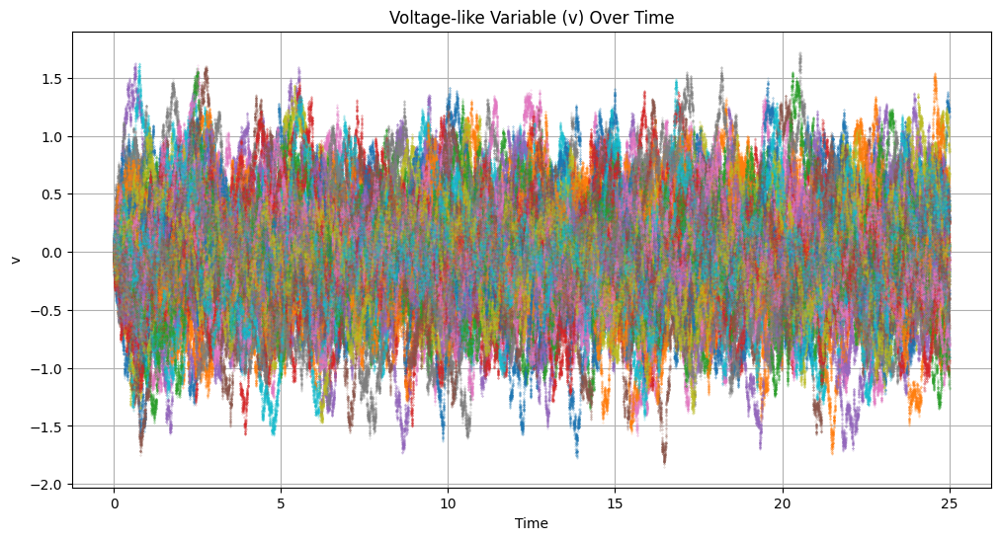

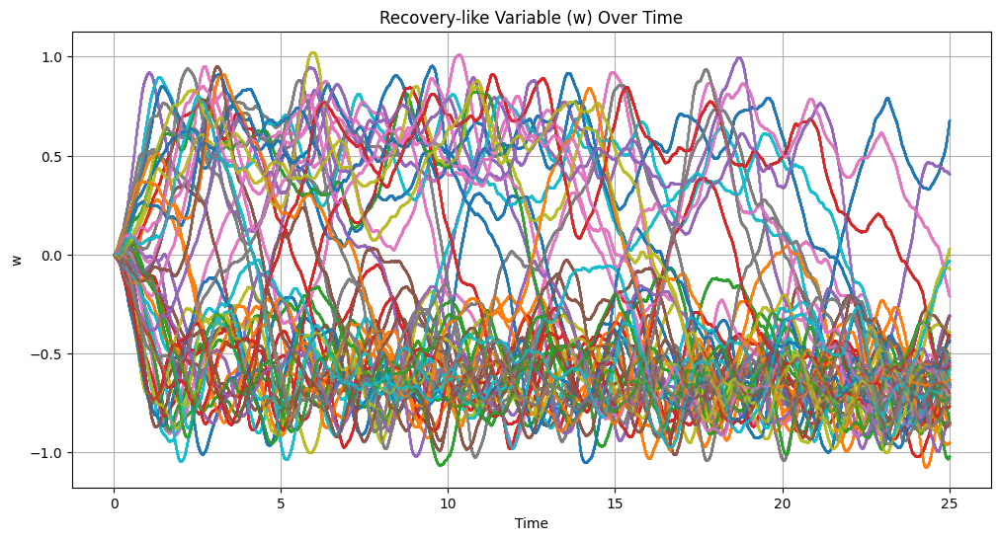

Optimising EM-based contrast estimator starts.
[2.08193421 1.48330915 0.79442298 1.00099576]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[2.08192539 1.48330879 0.798908   1.0009954 ]
Optimising LG-based contrast estimator ends.
Iteration 4
Compute the sample paths


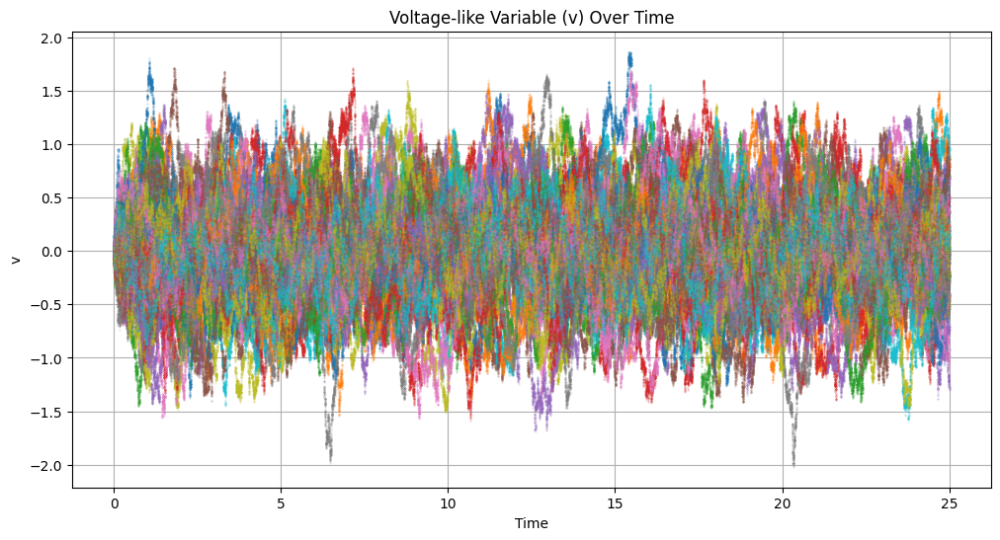

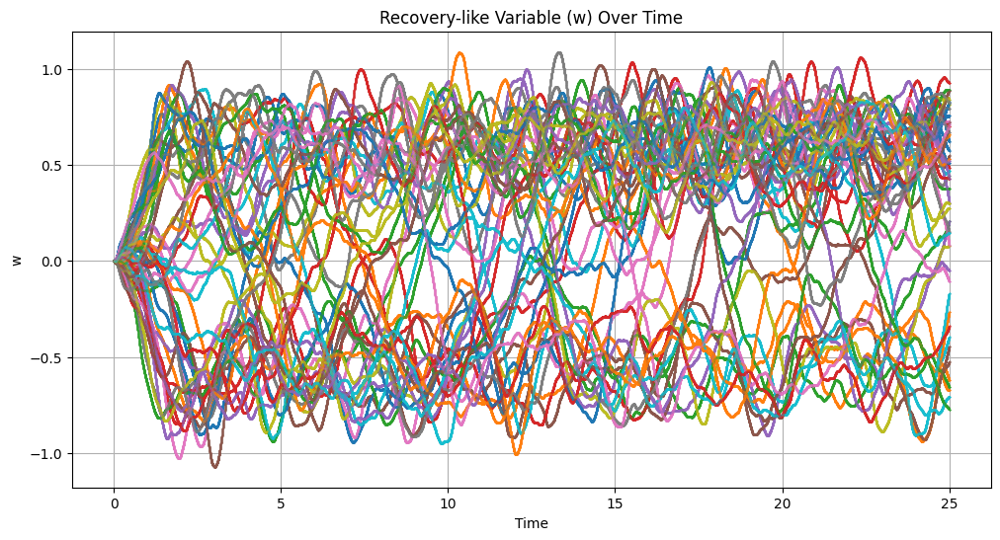

Optimising EM-based contrast estimator starts.
[1.94384754 1.51514852 0.79298872 1.01542115]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[1.94384527 1.5151484  0.79786354 1.01542079]
Optimising LG-based contrast estimator ends.
Iteration 5
Compute the sample paths


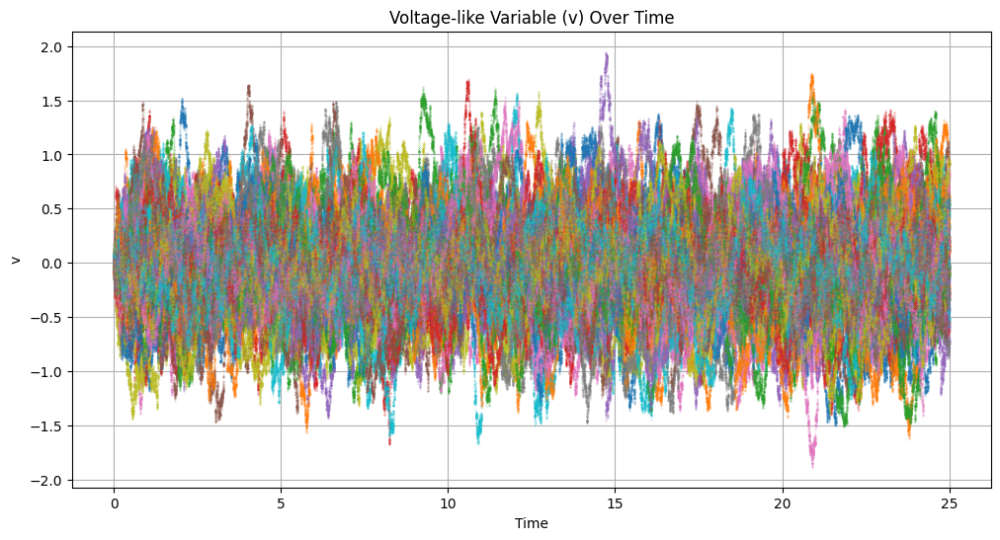

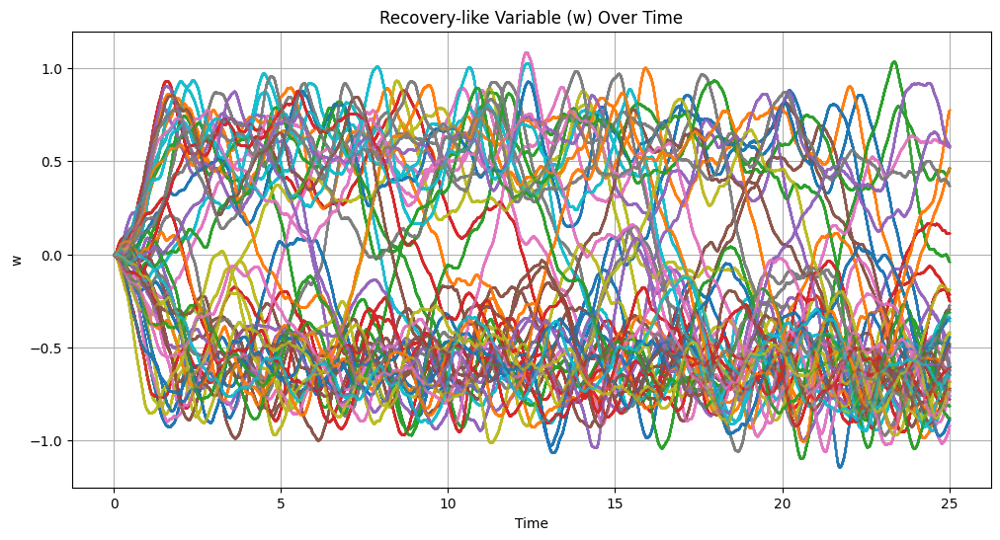

Optimising EM-based contrast estimator starts.
[1.95479238 1.55441165 0.79540974 0.90882558]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[1.9547888  1.55441129 0.79965734 0.90882534]
Optimising LG-based contrast estimator ends.
Iteration 6
Compute the sample paths


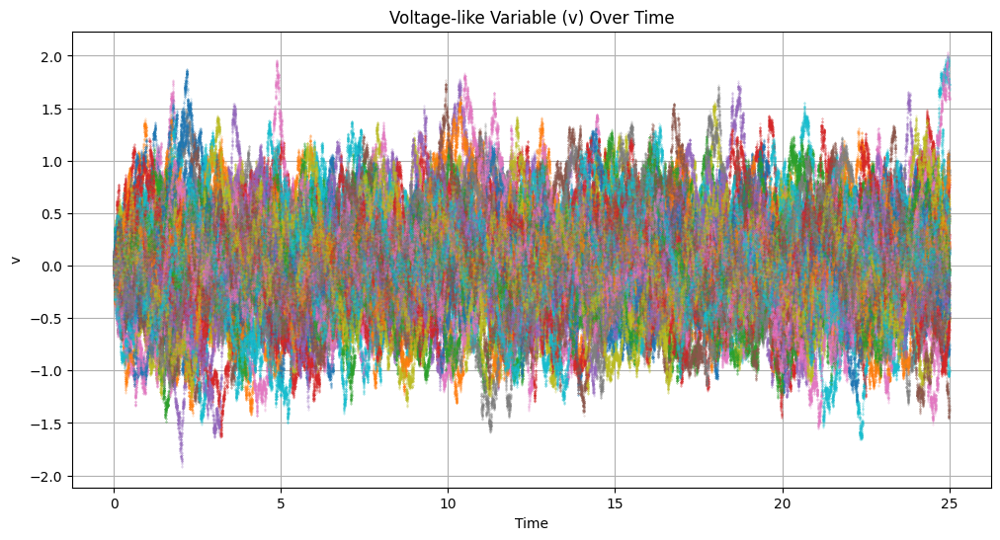

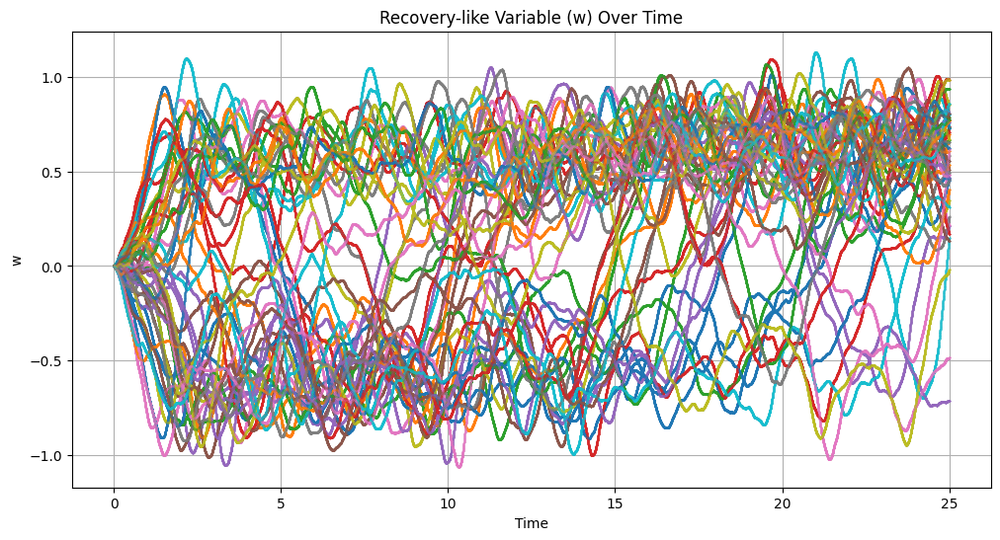

Optimising EM-based contrast estimator starts.
[1.94843221 1.48525333 0.7934916  0.99626905]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[1.94842875 1.48525321 0.79863501 0.99626875]
Optimising LG-based contrast estimator ends.
Iteration 7
Compute the sample paths


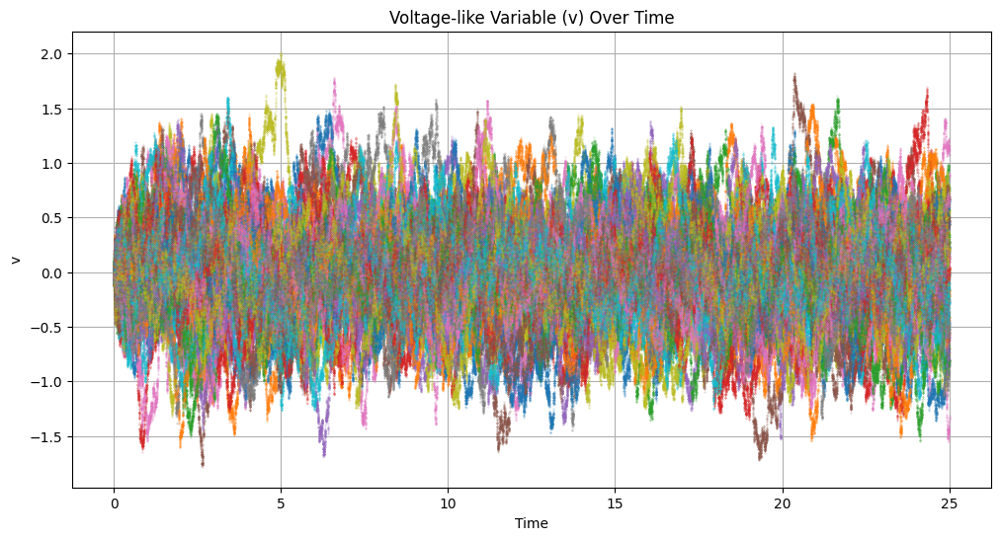

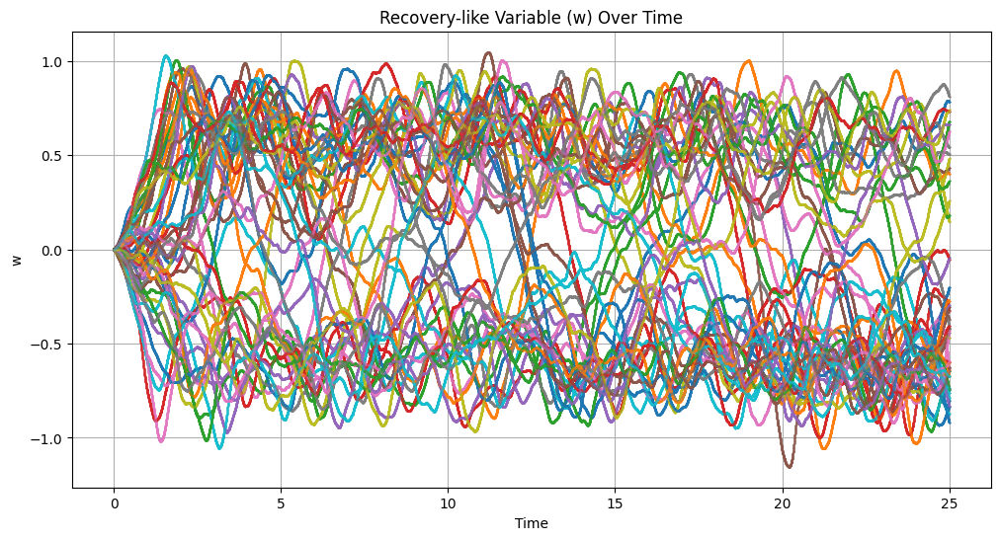

Optimising EM-based contrast estimator starts.
[2.02784467 1.56559396 0.79524982 1.00971115]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.
[2.02784181 1.56559396 0.79810512 1.00971079]
Optimising LG-based contrast estimator ends.
Iteration 8
Compute the sample paths


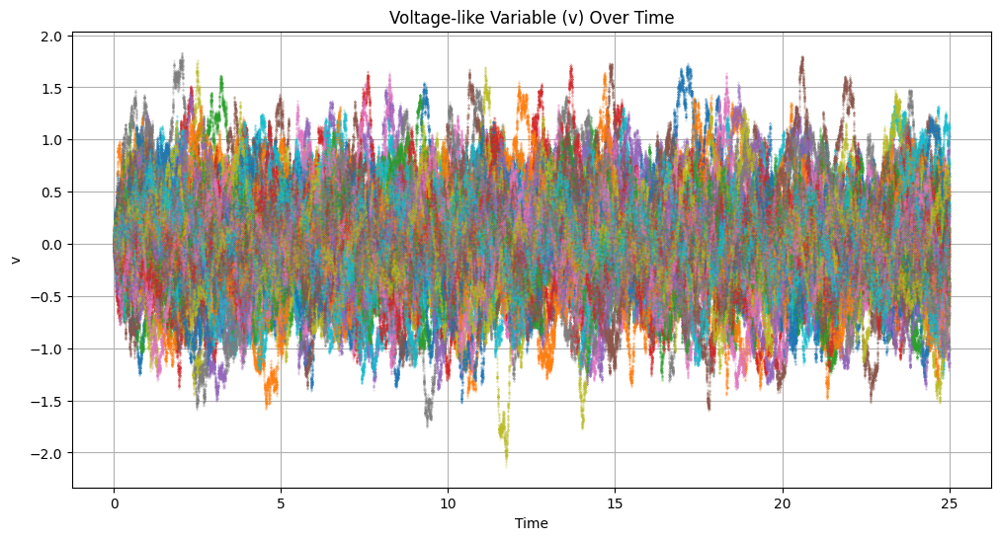

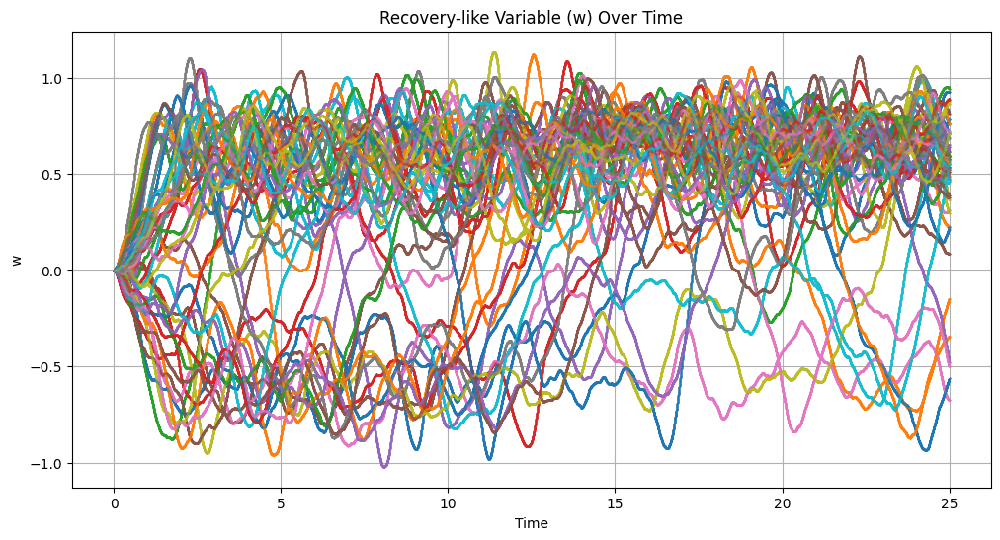

Optimising EM-based contrast estimator starts.
[2.06536222 1.52864587 0.79648554 0.96009779]
Optimising EM-based contrast estimator ends.
Optimising LG-based contrast estimator starts.


In [ ]:
# Simulation setting 
num_particles = 50  # Number of particles
dt_sim = 0.0005            # Time step for simulation 
dt_obs = 0.01           # Time step for observation (subsampling) 
num_steps = 50000     # Number of time steps for simulation
discard_steps = 0 # Steps to discard for initial transients  

# Interacting underdamped Langevin dynamics parameters
λ = 2.0  # Control the effect of double well-potential
γ = 1.5  # friction
σ = 0.8  # Noise strength
κ = 1.0  # Strength of interaction between particles

model_parameters = {'lambda': λ, 'gamma': γ, 'sigma': σ, 'kappa': κ} 

num_iter = 100
θ_seq_lg = np.zeros((4, num_iter))
θ_seq_em = np.zeros((4, num_iter))

log_likelihood_lg = get_log_likelihood_functions(jax_log_transition_densities['local_gaussian'])

log_likelihood_em = get_log_likelihood_functions(jax_log_transition_densities['euler_maruyama']) 
 

sub_interval = int(dt_obs/dt_sim) 
t_seq_sim = np.arange(discard_steps, num_steps) * dt_sim 
t_seq_obs = t_seq_sim[::sub_interval] 

for i in range(num_iter):
    print(f"Iteration {i+1}") 
    print("Compute the sample paths")
    x_seq_particles_sim = run_simulation(seed=int(20250625+i), num_particles=num_particles, num_steps=num_steps, dt=dt_sim, model_parameters=model_parameters, discard_steps=discard_steps)
    # Run simulation for each iteration
    x_seq_particles_obs = x_seq_particles_sim[::sub_interval, :, :]  # Downsampled for observation

    showplots(x_seq_particles_sim, x_seq_particles_obs,t_seq_sim, t_seq_obs)

    # x_seq_particles = x_seq_particles[:, :, 0:2]  # Voltage and recovery variables
    empirical_mean_seq = x_seq_particles_obs[:, :, 1].mean(axis=1)  # Mean of q over time for all particles

    θ_0 = np.array([0.1, 0.1, 0.1, 0.1])  # Initial guess for parameters 
    
    print("Optimising EM-based contrast estimator starts.")
    θ_seq_em[:, i] = compute_complete_maximum_likelihood_estimates(
        log_likelihood_em, t_seq_obs, x_seq_particles_obs, empirical_mean_seq, θ_0
    )
    print(θ_seq_em[:, i])
    print("Optimising EM-based contrast estimator ends.")

    print("Optimising LG-based contrast estimator starts.") 
    θ_seq_lg[:, i] = compute_complete_maximum_likelihood_estimates(
        log_likelihood_lg, t_seq_obs, x_seq_particles_obs, empirical_mean_seq, θ_0
    )
    print(θ_seq_lg[:, i])
    print("Optimising LG-based contrast estimator ends.") 




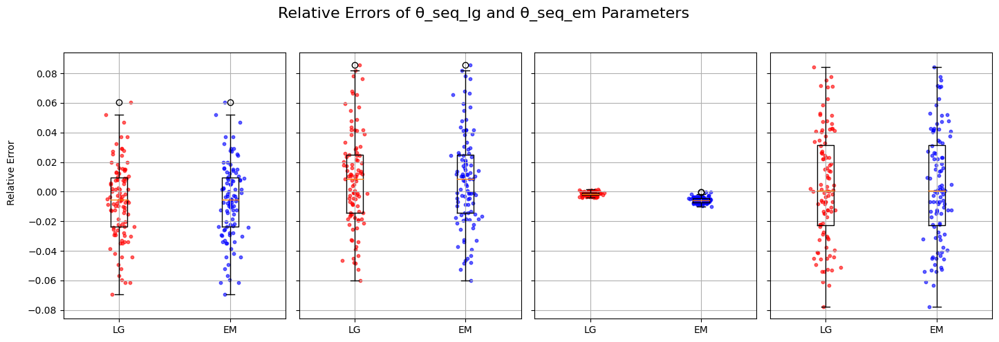

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of parameters
num_parameters = θ_seq_lg.shape[0]

# Create a single figure with subplots for relative errors of θ_seq_lg and θ_seq_em
fig, axes = plt.subplots(1, num_parameters, figsize=(15, 5), sharey=True)  # Adjust width and height
fig.suptitle("Relative Errors of θ_seq_lg and θ_seq_em Parameters", fontsize=16)

reference_values = [model_parameters['lambda'], model_parameters['gamma'], model_parameters['sigma'], model_parameters['kappa']]
parameter_labels = ['λ', 'γ', 'σ', 'κ']  # True labels from model_parameters

for i in range(num_parameters):
    # Data for LG relative errors for the current parameter
    lg_data = (θ_seq_lg[i, :] - reference_values[i]) / reference_values[i]
    em_data = (θ_seq_em[i, :] - reference_values[i]) / reference_values[i]
    
    # Create boxplot for the current parameter
    axes[i].boxplot([lg_data, em_data], labels=['LG', 'EM'])
    axes[i].grid(True)

    # Overlay scattered points for LG and EM
    lg_positions = np.random.normal(1, 0.05, size=len(lg_data))  # Add slight jitter for LG
    em_positions = np.random.normal(2, 0.05, size=len(em_data))  # Add slight jitter for EM
    axes[i].scatter(lg_positions, lg_data, alpha=0.6, color='red', s=10, label='LG Data Points')
    axes[i].scatter(em_positions, em_data, alpha=0.6, color='blue', s=10, label='EM Data Points')

# Add a shared y-axis label
fig.text(0.04, 0.5, 'Relative Error', va='center', rotation='vertical')

plt.tight_layout(rect=[0.05, 0, 1, 0.95])  # Adjust layout to fit the title
plt.show()

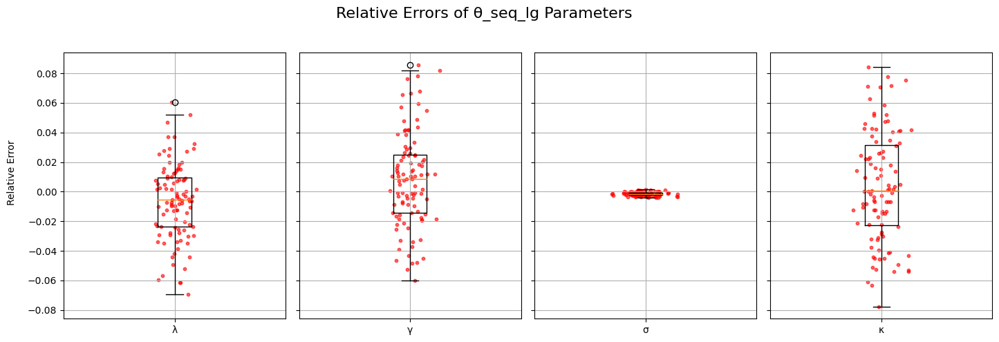

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of parameters
num_parameters = θ_seq_lg.shape[0]

# Create a single figure with subplots for relative errors of θ_seq_lg
fig, axes = plt.subplots(1, num_parameters, figsize=(15, 5), sharey=True)  # Adjust width and height
fig.suptitle("Relative Errors of θ_seq_lg Parameters", fontsize=16)

reference_values = [model_parameters['lambda'], model_parameters['gamma'], model_parameters['sigma'], model_parameters['kappa']]
parameter_labels = ['λ', 'γ', 'σ', 'κ']  # True labels from model_parameters

for i in range(num_parameters):
    # Data for LG relative errors for the current parameter
    data = (θ_seq_lg[i, :] - reference_values[i]) / reference_values[i]
    
    # Create boxplot for the current parameter
    axes[i].boxplot(data, labels=[parameter_labels[i]])
    axes[i].grid(True)

    # Overlay scattered points for LG
    x_positions = np.random.normal(1, 0.05, size=len(data))  # Add slight jitter for better visualization
    axes[i].scatter(x_positions, data, alpha=0.6, color='red', s=10, label='Data Points')

# Add a shared y-axis label
fig.text(0.04, 0.5, 'Relative Error', va='center', rotation='vertical')

plt.tight_layout(rect=[0.05, 0, 1, 0.95])  # Adjust layout to fit the title
plt.show()

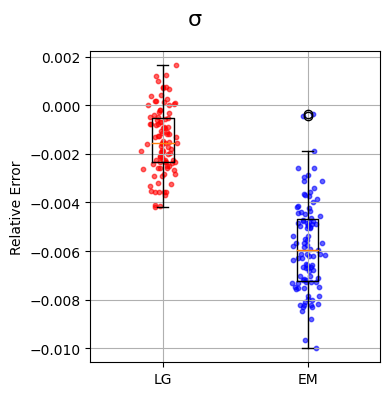

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure for the boxplot of σ
fig, ax = plt.subplots(figsize=(4, 4))
fig.suptitle("σ", fontsize=16)

reference_value = model_parameters['sigma']  # True value of σ

# Data for LG and EM relative errors for σ
lg_data = (θ_seq_lg[2, :] - reference_value) / reference_value
em_data = (θ_seq_em[2, :] - reference_value) / reference_value

# Create boxplot for σ
ax.boxplot([lg_data, em_data], labels=['LG', 'EM'])
ax.grid(True)

# Overlay scattered points for LG and EM
lg_positions = np.random.normal(1, 0.05, size=len(lg_data))  # Add slight jitter for LG
em_positions = np.random.normal(2, 0.05, size=len(em_data))  # Add slight jitter for EM
ax.scatter(lg_positions, lg_data, alpha=0.6, color='red', s=10, label='LG Data Points')
ax.scatter(em_positions, em_data, alpha=0.6, color='blue', s=10, label='EM Data Points')

# Add y-axis label
ax.set_ylabel('Relative Error')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Combine θ_seq_lg and θ_seq_em into a single DataFrame
data = {
    f"LG_θ_{i+1}": θ_seq_lg[i, :] for i in range(θ_seq_lg.shape[0])
}
data.update({
    f"EM_θ_{i+1}": θ_seq_em[i, :] for i in range(θ_seq_em.shape[0])
})

df = pd.DataFrame(data)

# Write the DataFrame to a CSV file
output_file = "theta_sequences_ips_underdamped_LD.csv"
df.to_csv(output_file, index=False)

print(f"Data successfully written to {output_file}")

Data successfully written to theta_sequences_ips_underdamped_LD.csv
